In [2]:
import numpy as np
from scipy.optimize import fsolve
import matplotlib.pyplot as plt

In [3]:
L = 1.0
m = 0.1 
f_target = 440 
omega_target = 2 * np.pi * f_target 

In [4]:
def char_eq(k, EI):
    if k == 0:
        return 1e6
    return (np.cos(k * L) * np.cosh(k * L) + 1) + (m * k / EI) * (
            np.sin(k * L) * np.cosh(k * L) - np.sinh(k * L) * np.cos(k * L))

In [5]:
def target(EI):
    k1_sol = fsolve(lambda k: char_eq(k, EI), 1.5)[0]
    omega_calculated = k1_sol ** 2 * np.sqrt(EI)
    return omega_calculated - omega_target

In [6]:
EI_guess = (omega_target ** 2 * m * L ** 3) / 3
EI_solution = fsolve(target, EI_guess)[0]
print(f"Рассчитанное EI: {EI_solution:.4f} Н·м²")

Рассчитанное EI: 618248.8312 Н·м²


In [7]:
k_guesses = [1.5, 4.5, 7.5, 10.5]
k_solutions = [fsolve(lambda k: char_eq(k, EI_solution), guess)[0] for guess in k_guesses]

omega_n = [k ** 2 * np.sqrt(EI_solution) for k in k_solutions]
print(f"Собственные частоты: {[omega / (2 * np.pi) for omega in omega_n]}")

Собственные частоты: [439.99999999999983, 2757.4329313395497, 7720.8920521983255, 15129.866909176271]


In [8]:
def mode_shape(k, x) -> np.ndarray[float]:
    gamma = (np.cos(k * L) + np.cosh(k * L)) / (np.sin(k * L) + np.sinh(k * L))
    return np.cos(k * x) - np.cosh(k * x) - gamma * (np.sin(k * x) - np.sinh(k * x))

In [9]:
x = np.linspace(0, L, 100)
modes = []
for k in k_solutions:
    phi = mode_shape(k, x)
    phi /= np.max(np.abs(phi))
    modes.append(phi)

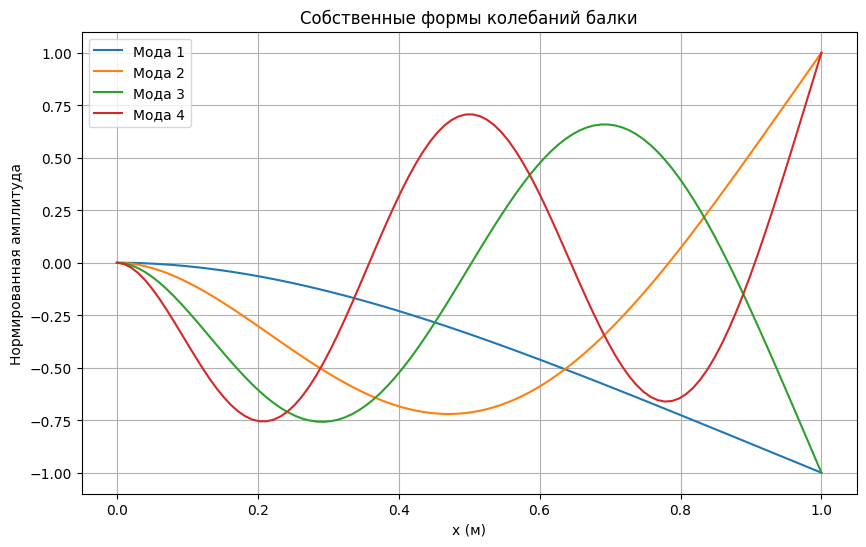

In [10]:
plt.figure(figsize=(10, 6))
for i, phi in enumerate(modes):
    plt.plot(x, phi, label=f'Мода {i + 1}')
plt.title('Собственные формы колебаний балки')
plt.xlabel('x (м)')
plt.ylabel('Нормированная амплитуда')
plt.legend()
plt.grid(True)
plt.show()

In [11]:
g = 9.81 
A1 = 0.01
B1 = 0

In [12]:
def w_static(x):
    return (m * g / (6 * EI_solution)) * (-x ** 3 + 3 * L * x ** 2)

In [13]:
k1 = k_solutions[0]
omega1 = omega_n[0]
phi1 = mode_shape(k1, x)
phi1 /= np.max(np.abs(phi1))

In [14]:
t = np.linspace(0, 2 * 2 * np.pi / omega1, 500)
Xgrid, T = np.meshgrid(x, t, indexing='ij')

In [15]:
W_stat = w_static(Xgrid)
W_dyn = phi1[:, None] * (A1 * np.cos(omega1 * T) + B1 * np.sin(omega1 * T))
W_total = W_stat + W_dyn

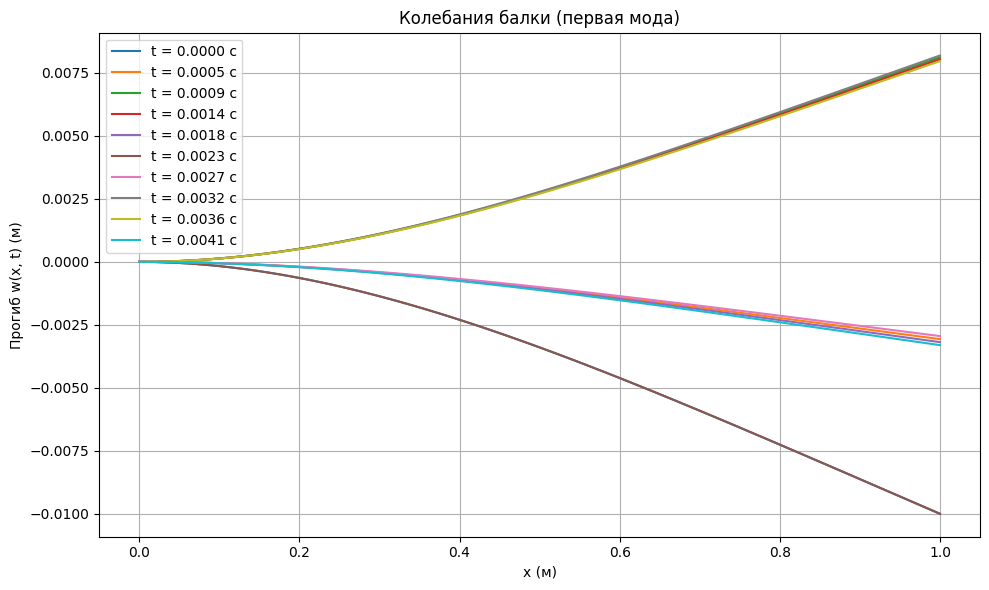

In [16]:
plt.figure(figsize=(10, 6))
for i in range(0, len(t), 50):
    plt.plot(x, W_total[:, i], label=f't = {t[i]:.4f} с')
plt.title('Колебания балки (первая мода)')
plt.xlabel('x (м)')
plt.ylabel('Прогиб w(x, t) (м)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [17]:
x = np.linspace(0, L, 200) 
k1 = k_solutions[0]
omega1 = omega_n[0]
phi1 = mode_shape(k1, x)
phi1 /= np.max(np.abs(phi1))

In [18]:
period = 2 * np.pi / omega1
t = np.linspace(0, 4 * period, 300)

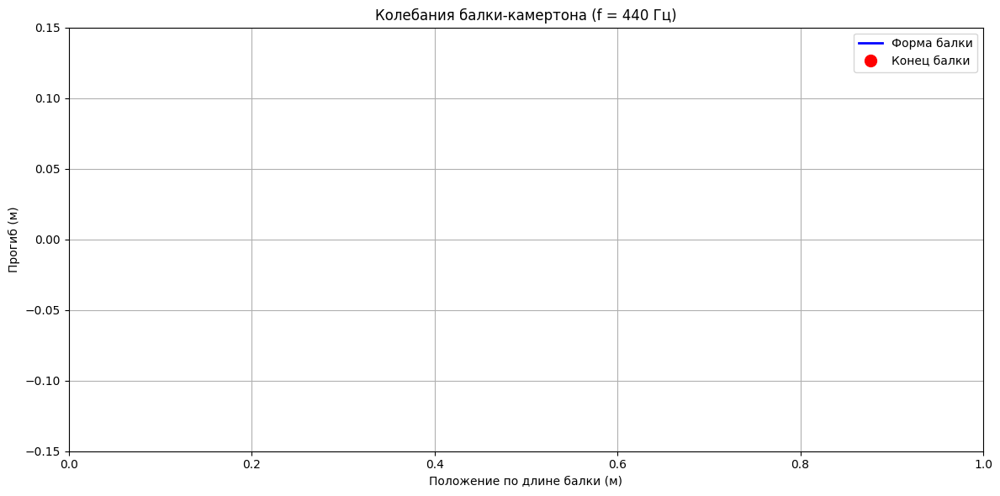

In [19]:
from matplotlib.animation import FuncAnimation

fig, ax = plt.subplots(figsize=(12, 6))
ax.set_xlim(0, L)
ax.set_ylim(-0.15, 0.15)
ax.set_title(f'Колебания балки-камертона (f = {f_target} Гц)')
ax.set_xlabel("Положение по длине балки (м)")
ax.set_ylabel("Прогиб (м)")
ax.grid(True)

line, = ax.plot([], [], 'b-', linewidth=2, label='Форма балки')
point, = ax.plot([], [], 'ro', markersize=10, label='Конец балки')
ax.legend(loc='upper right')
time_text = ax.text(0.02, 0.95, '', transform=ax.transAxes)


def init():
    line.set_data([], [])
    point.set_data([], [])
    time_text.set_text('')
    return line, point, time_text


def animate(i):
    current_time = t[i]

    w_dynamic = phi1 * np.cos(omega1 * current_time) * 0.05  # Амплитуда 5 см
    w_total = w_static(x) + w_dynamic

    line.set_data(x, w_total)
    point.set_data(L, w_total[-1])
    time_text.set_text(f'Время: {current_time:.3f} с\nПериод: {period:.3f} с')

    return line, point, time_text


anim = FuncAnimation(
    fig,
    animate,
    frames=len(t),
    init_func=init,
    blit=True,
    interval=20,
    repeat=True
)

plt.tight_layout()
plt.show()

In [20]:
from IPython.display import HTML

HTML(anim.to_jshtml())

D:\Users\Boris\AppData\Local\Temp\ipykernel_8716\2797055836.py:31: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  point.set_data(L, w_total[-1])
